In [1]:
import torchvision
from PIL import Image
from torchvision import transforms as T
import cv2
import matplotlib
from matplotlib import pyplot as plt

In [2]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(original_name=FrozenBatchNorm2d)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(original_name=FrozenBatchNorm2d)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(original_name=FrozenBatchNorm2d)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(original_name=FrozenBatchNorm2d)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
       

In [3]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [4]:
def get_prediction(img_path, threshold):
  img = Image.open(img_path) # Load the image
  transform = T.Compose([T.ToTensor()]) # Defing PyTorch Transform
  img = transform(img) # Apply the transform to the image
  pred = model([img]) # Pass the image to the model
  pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())] # Get the Prediction Score
  pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())] # Bounding boxes
  pred_score = list(pred[0]['scores'].detach().numpy())
  pred_t = [pred_score.index(x) for x in pred_score if x > threshold][-1] # Get list of index with score greater than threshold.
  pred_boxes = pred_boxes[:pred_t+1]
  pred_class = pred_class[:pred_t+1]
  return pred_boxes, pred_class

In [5]:
def object_detection_api(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3):

  boxes, pred_cls = get_prediction(img_path, threshold) # Get predictions
  img = cv2.imread(img_path) # Read image with cv2
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB
  for i in range(len(boxes)):
    cv2.rectangle(img, boxes[i][0], boxes[i][1],color=(0, 255, 0), thickness=rect_th) # Draw Rectangle with the coordinates
    cv2.putText(img,pred_cls[i], boxes[i][0],  cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th) # Write the prediction class
  plt.figure(figsize=(20,30)) # display the output image
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.show()

In [6]:
!wget https://www.wsha.org/wp-content/uploads/banner-diverse-group-of-people-2.jpg -O people.jpg

--2020-03-03 13:21:15--  https://www.wsha.org/wp-content/uploads/banner-diverse-group-of-people-2.jpg
Resolving www.wsha.org (www.wsha.org)... 104.198.7.33
Connecting to www.wsha.org (www.wsha.org)|104.198.7.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1923610 (1.8M) [image/jpeg]
Saving to: ‘people.jpg’

people.jpg          100%[===================>]   1.83M  1.88MB/s    in 1.0s    

2020-03-03 13:21:17 (1.88 MB/s) - ‘people.jpg’ saved [1923610/1923610]



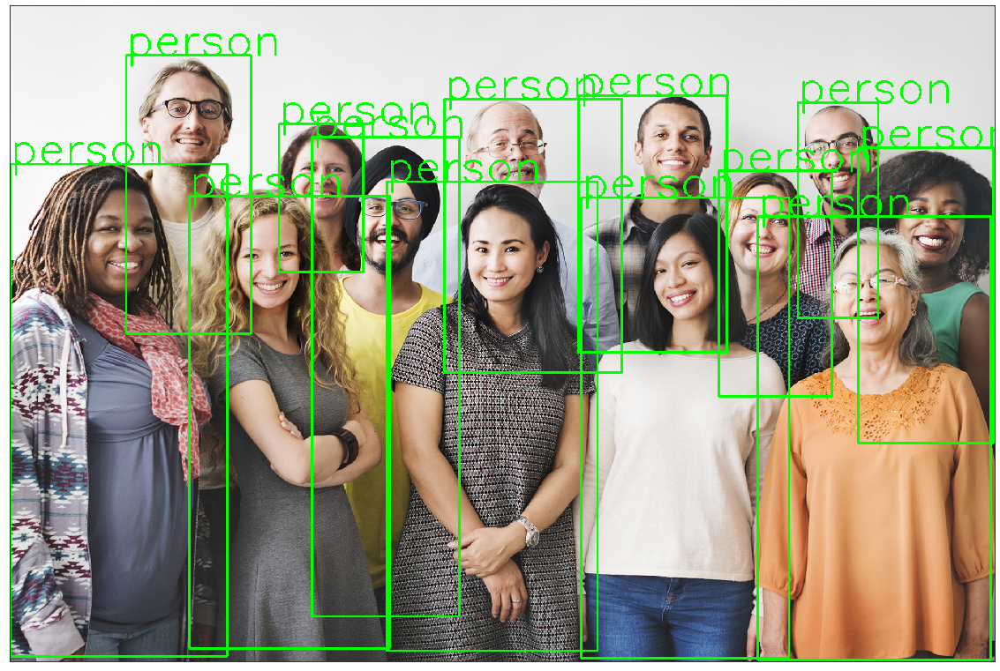

CPU times: user 9.66 s, sys: 1.24 s, total: 10.9 s
Wall time: 5.34 s


In [7]:
%%time
object_detection_api('./people.jpg', threshold=0.8)

In [8]:
!wget https://www.thetelegram.com/media/photologue/photos/cache/STJ-A01-28102019-RawlinsCrossPedestrians3_large.jpg

--2020-03-03 13:21:22--  https://www.thetelegram.com/media/photologue/photos/cache/STJ-A01-28102019-RawlinsCrossPedestrians3_large.jpg
Resolving www.thetelegram.com (www.thetelegram.com)... 209.172.61.44
Connecting to www.thetelegram.com (www.thetelegram.com)|209.172.61.44|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 91842 (90K) [image/jpeg]
Saving to: ‘STJ-A01-28102019-RawlinsCrossPedestrians3_large.jpg.1’

STJ-A01-28102019-Ra 100%[===================>]  89.69K   539KB/s    in 0.2s    

2020-03-03 13:21:23 (539 KB/s) - ‘STJ-A01-28102019-RawlinsCrossPedestrians3_large.jpg.1’ saved [91842/91842]



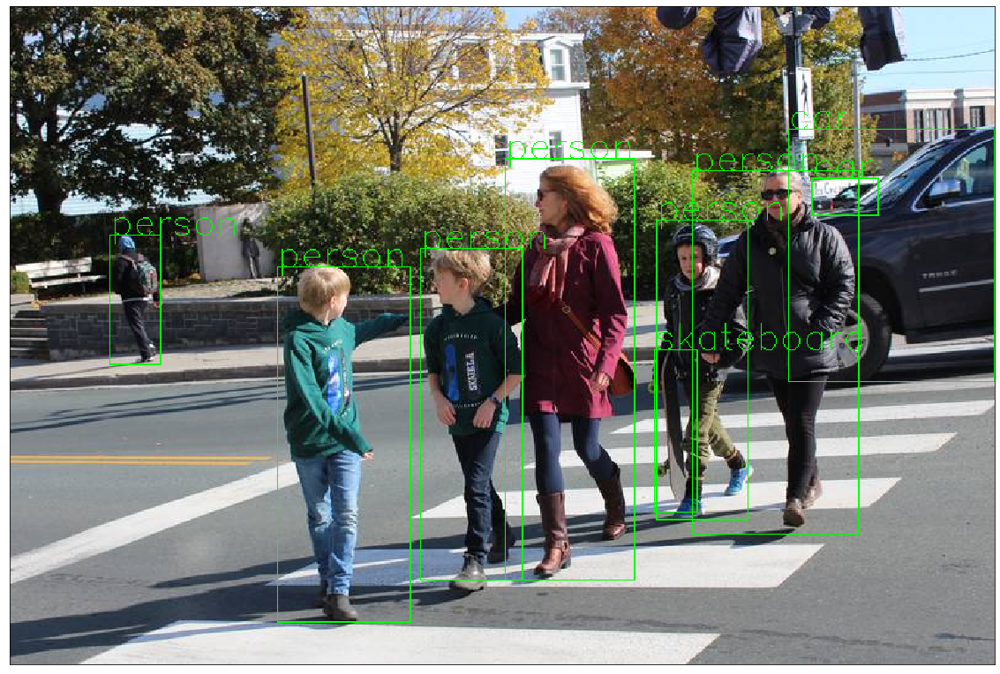

CPU times: user 9.32 s, sys: 753 ms, total: 10.1 s
Wall time: 3.87 s


In [9]:
%%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./STJ-A01-28102019-RawlinsCrossPedestrians3_large.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)

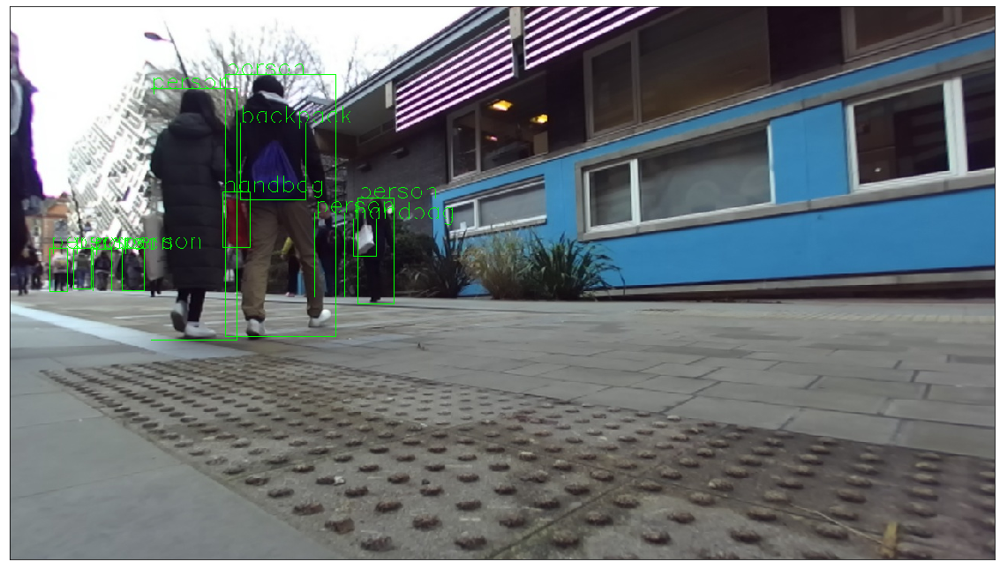

CPU times: user 9.71 s, sys: 990 ms, total: 10.7 s
Wall time: 4.01 s


In [10]:
%%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./frame0600.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)

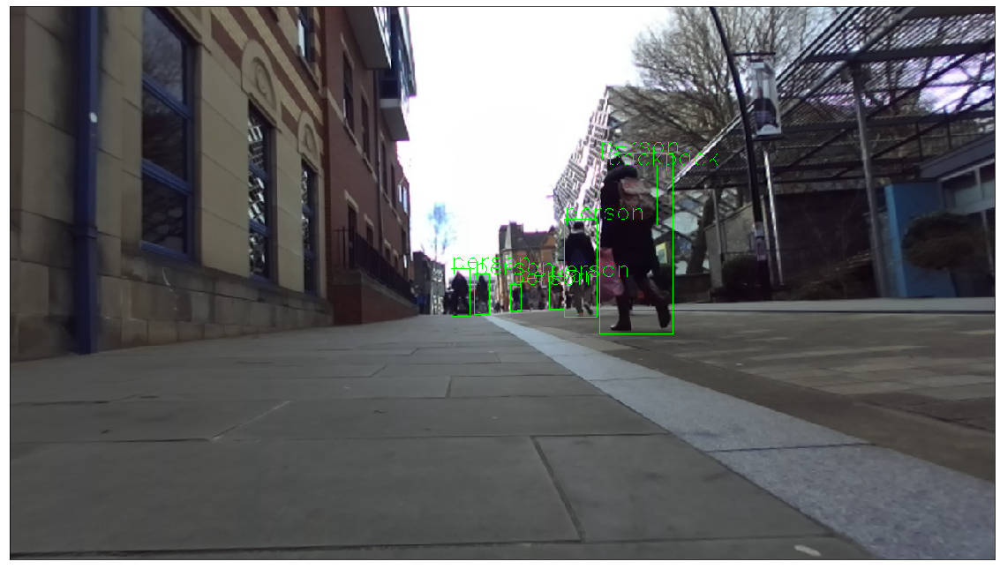

CPU times: user 10 s, sys: 407 ms, total: 10.4 s
Wall time: 3.97 s


In [13]:
%%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./frame0700.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)

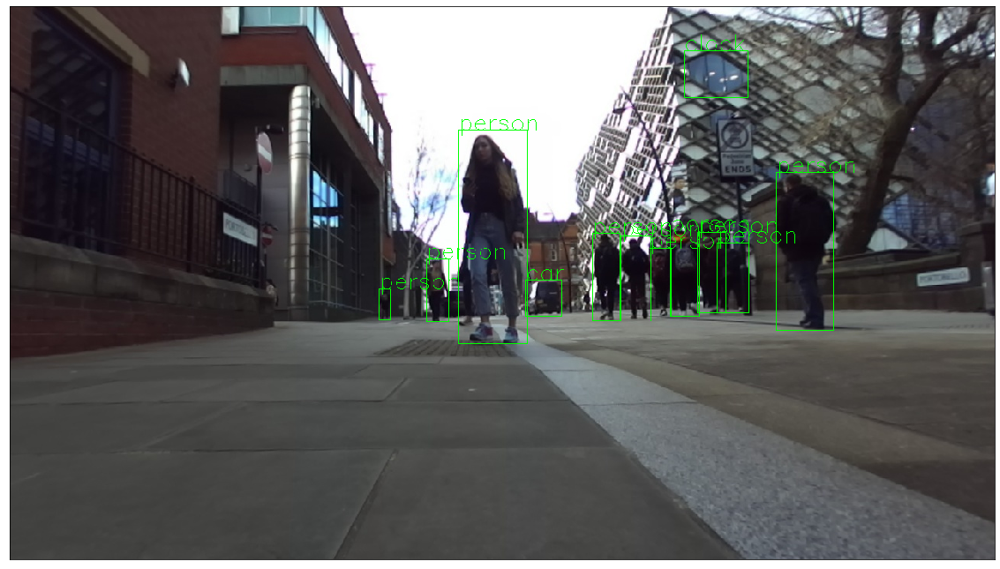

CPU times: user 9.89 s, sys: 439 ms, total: 10.3 s
Wall time: 3.85 s


In [14]:
%%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./frame0900.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)

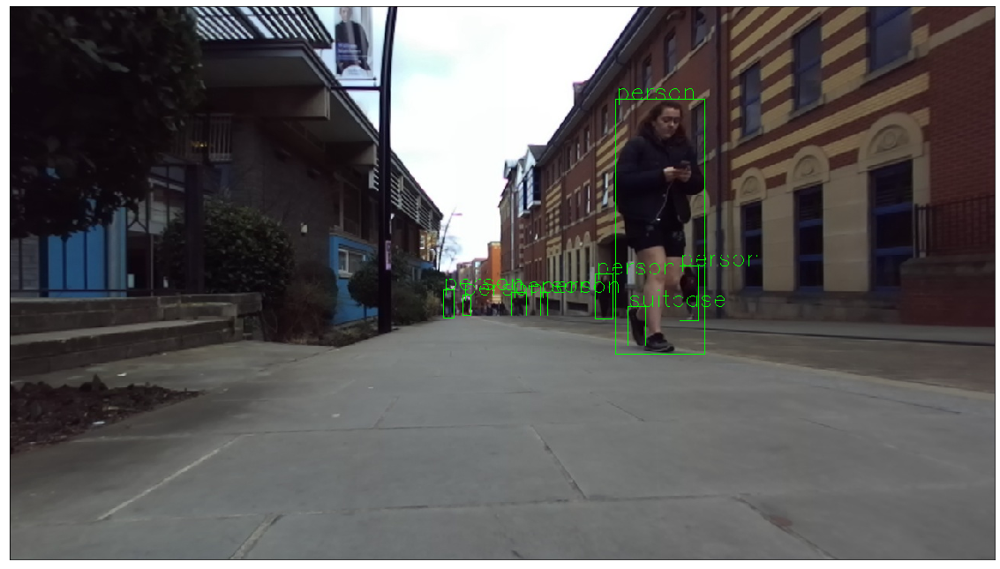

In [15]:
## %%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./frame1291.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)

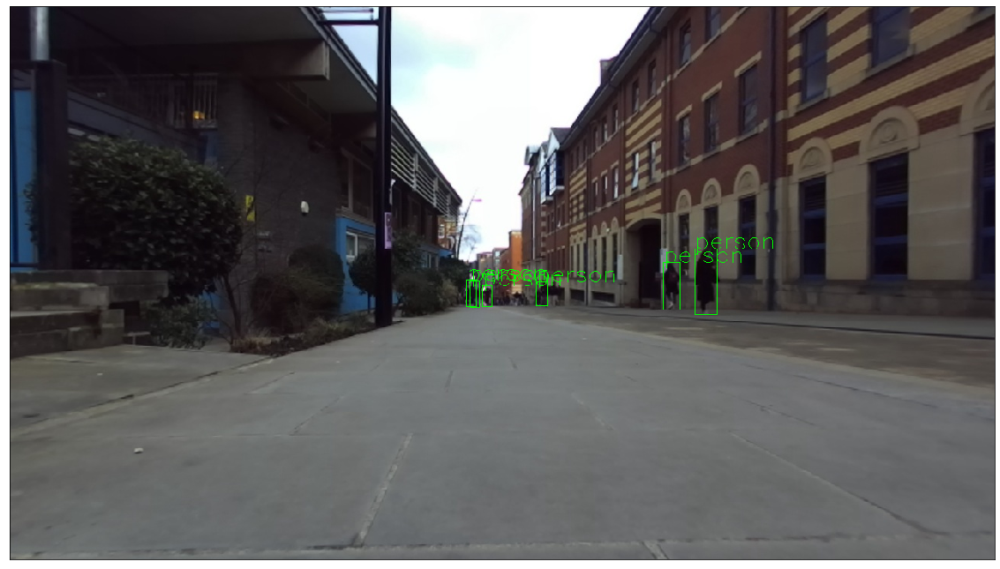

CPU times: user 9.79 s, sys: 457 ms, total: 10.3 s
Wall time: 3.86 s


In [16]:
%%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./frame1309.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)

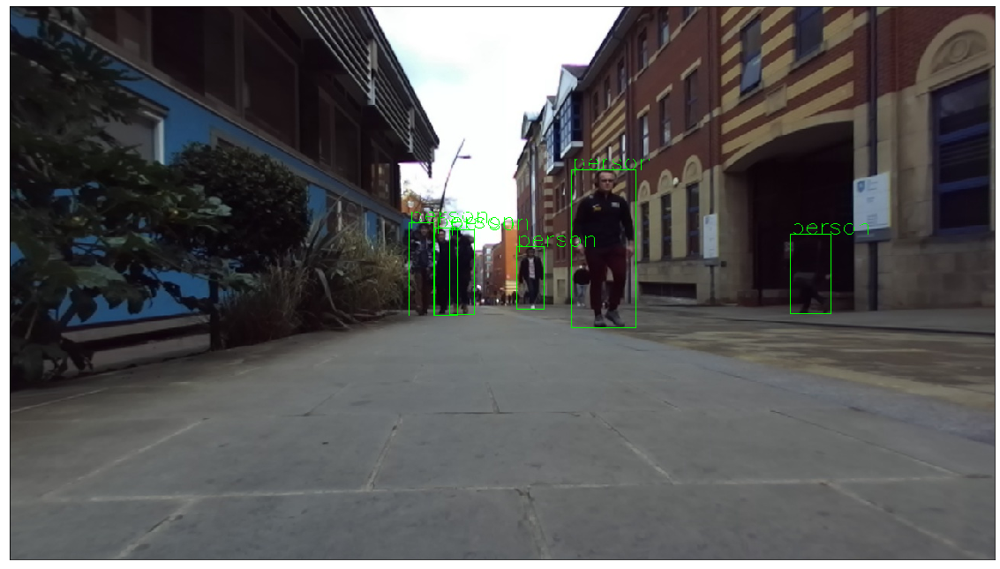

CPU times: user 9.84 s, sys: 411 ms, total: 10.3 s
Wall time: 3.85 s


In [17]:
%%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./frame1441.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)

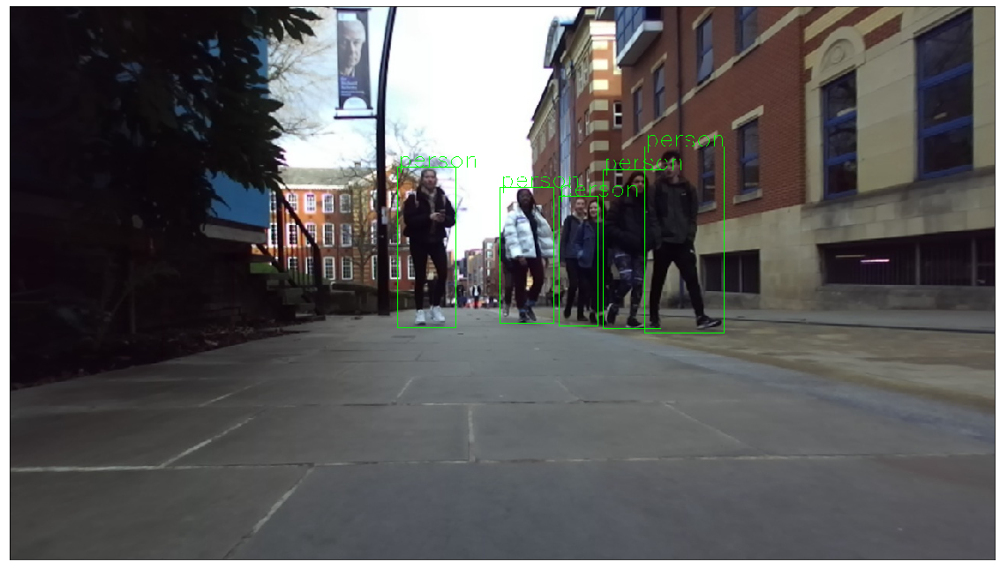

CPU times: user 9.82 s, sys: 427 ms, total: 10.2 s
Wall time: 3.84 s


In [18]:
%%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./frame1700.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)

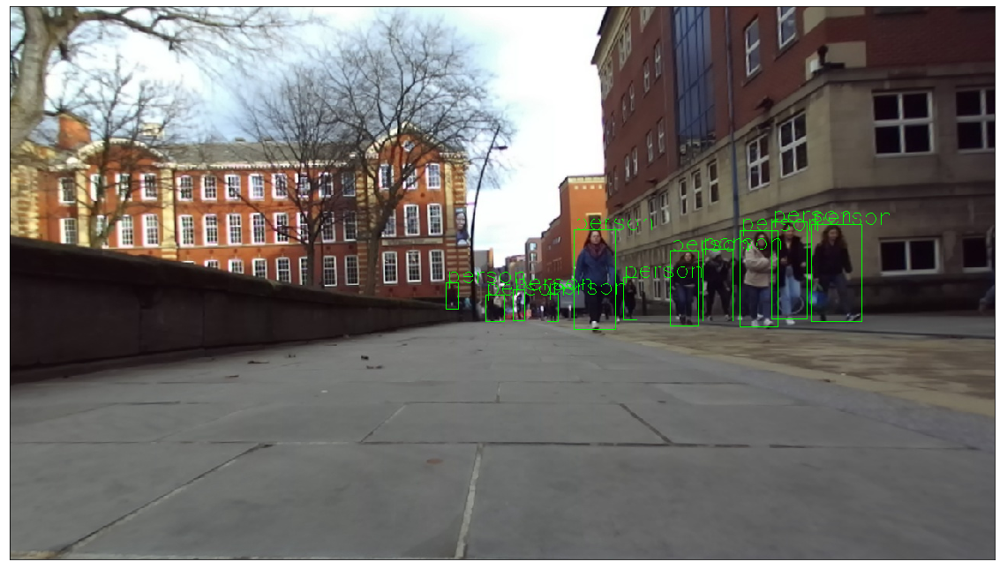

CPU times: user 10.1 s, sys: 426 ms, total: 10.6 s
Wall time: 3.97 s


In [19]:
%%time
# source: https://www.thetelegram.com/opinion/local-perspectives/editorial-put-pedestrians-first-381333/
object_detection_api('./frame1900.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)